In [1]:
import cv2
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from utils import *
import os
# Photo by Jesse Mills on Unsplash

In [2]:
import gc # RAM Cleanup
gc.enable()

In [3]:
from scipy.sparse.linalg import lsqr

In [4]:
from scipy.sparse.linalg import spsolve

In [5]:
import scipy

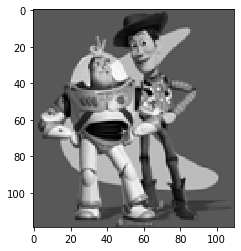

In [6]:
toy_img = cv2.cvtColor(cv2.imread('samples/toy_problem.png'), cv2.COLOR_BGR2RGB)
toy_img = cv2.cvtColor(toy_img, cv2.COLOR_BGR2GRAY).astype('double') / 255.0
plt.imshow(toy_img, cmap="gray")

## Part 1 Toy Problem (20 pts)

In [7]:
def A_matrix(n, m):   
    D = scipy.sparse.lil_matrix((m, m))
    D.setdiag(-1, -1)
    D.setdiag(4)
    D.setdiag(-1, 1)
    A = scipy.sparse.block_diag([D] * n).tolil()
    A.setdiag(-1, 1*m)
    A.setdiag(-1, -1*m)
    return A

In [8]:
def toy_reconstruct(im):
    """
    The implementation for gradient domain processing is not complicated, but it is easy to make a mistake, so let's start with a toy example. Reconstruct this image from its gradient values, plus one pixel intensity. Denote the intensity of the source image at (x, y) as s(x,y) and the value to solve for as v(x,y). For each pixel, then, we have two objectives:
    1. minimize (v(x+1,y)-v(x,y) - (s(x+1,y)-s(x,y)))^2
    2. minimize (v(x,y+1)-v(x,y) - (s(x,y+1)-s(x,y)))^2
    Note that these could be solved while adding any constant value to v, so we will add one more objective:
    3. minimize (v(1,1)-s(1,1))^2
    
    :param toy_img: numpy.ndarray
    """
    im_h, im_w = im.shape
    A = A_matrix(im_h, im_w)
    b = A.dot(im.flatten())
    v = scipy.sparse.linalg.lsqr(A, b, atol=1e-12, btol=1e-12)[0]
    v[v > 1] = 1
    v[v < 0] = 0
    return v.reshape(im_h, im_w)

In [10]:
im_out = toy_reconstruct(toy_img)
if im_out.any():
    print("Error is: ", np.sqrt(((im_out - toy_img)**2).sum()))

Error is:  6.792595052418236e-07


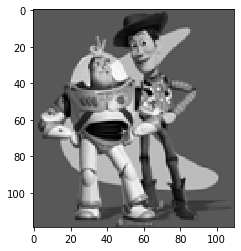

In [11]:
plt.imshow(im_out, cmap='gray')

## Preparation

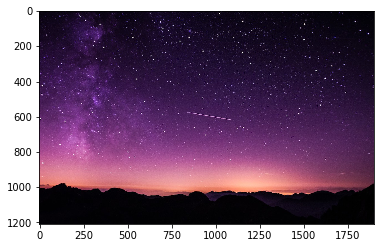

In [39]:
# Feel free to change image
background_img = cv2.cvtColor(cv2.imread('samples/big-night-sky.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


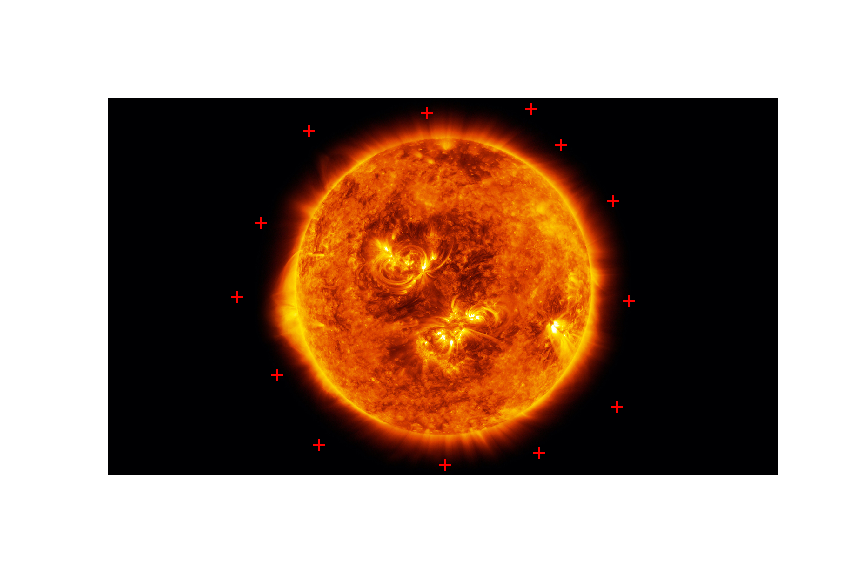

In [55]:
# Feel free to change image
object_img = cv2.cvtColor(cv2.imread('samples/sun-real-sm.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
import matplotlib.pyplot as plt
%matplotlib notebook
mask_coords = specify_mask(object_img)

<Figure size 432x288 with 0 Axes>

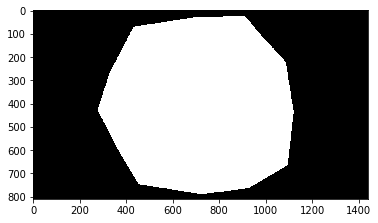

In [56]:
xs = mask_coords[0]
ys = mask_coords[1]
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure()
mask = get_mask(ys, xs, object_img)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


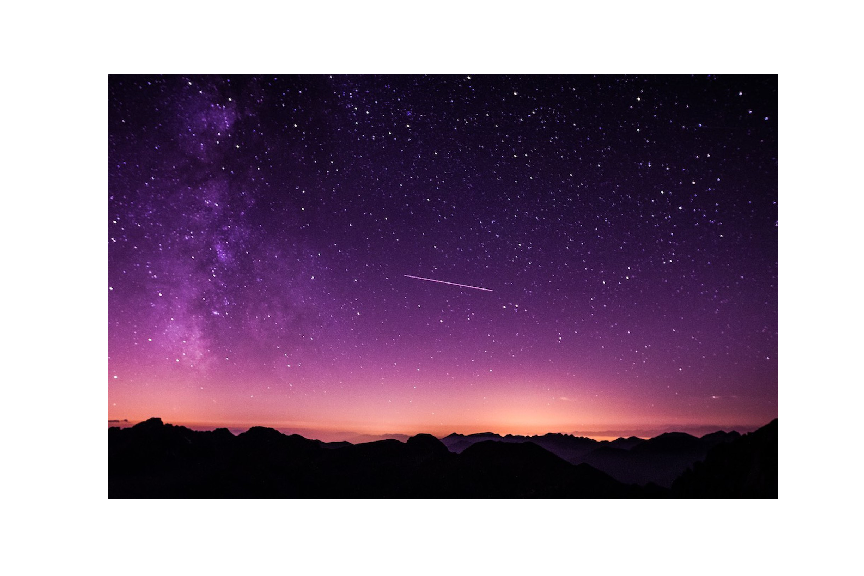

In [40]:
%matplotlib notebook
import matplotlib.pyplot as plt
bottom_center = specify_bottom_center(background_img)

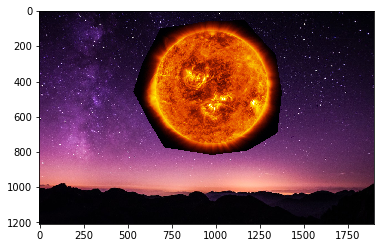

In [57]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

In [42]:
object_mask.shape

(1208, 1900)

In [9]:
def show_3_imgs(background_img, object_img, im_blend, failed=False):
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(17, 10))
    axs[0].imshow(background_img)
    axs[0].set_title("Background")
    axs[1].imshow(object_img)
    axs[1].set_title("Source")
    axs[2].imshow(im_blend)
    axs[2].set_title("Blended")
    if failed:
        fig.suptitle("Failed result")

In [10]:
def show_2_imgs(color_img, gray_img, hsv=True):
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(17, 10))
    if hsv:
        axs[0].imshow(cv2.cvtColor(color_img.astype('uint8'), cv2.COLOR_HSV2RGB))
    axs[0].set_title("Color image")
    axs[1].imshow(gray_img, cmap='gray')
    axs[1].set_title("Gray image")

## Part 2 Poisson Blending (50 pts)

In [11]:
import scipy
from scipy.sparse.linalg import spsolve

In [12]:
def gradient_sum(img, i, j, h, w):
    v_sum = np.array([0.0, 0.0, 0.0])
    v_sum = img[i, j] * 4 \
        - img[i + 1, j] - img[i - 1, j] - img[i, j + 1] - img[i, j - 1]
    return v_sum

In [13]:
def poisson_blend(cropped_object, object_mask, background_img, bc):
    """
    :param cropped_object: numpy.ndarray One you get from align_cropped_object
    :param object_object_mask: numpy.ndarray One you get from align_cropped_object
    :param background_img: numpy.ndarray 
    """
    mask_height, mask_width = object_mask.shape
    region_size = mask_height * mask_width
    ####################
    # Helper functions #
    ####################
    getk = lambda i, j: i + j * mask_height
    grad_func = lambda ii, jj: gradient_sum(
                cropped_object, ii, jj, mask_height, mask_width) # Gradient function
    ### Initializing "A" and "b" ###
    b = np.zeros((region_size, 3)) # the "b" matrix
    A = scipy.sparse.identity(region_size, format='lil') # the "A" matrix
    ###################################
    ### Creating A and b for Ax = b ###
    ###################################
    for i in range(mask_height):
        for j in range(mask_width):
            k = getk(i, j)
            if object_mask[i, j] == 1: # We only need to do it in the blending region
                b_s = np.array([0.0, 0.0, 0.0])
                
                if object_mask[i - 1, j] == 1:
                    A[k, k - 1] = -1
                else:
                    b_s += background_img[i - 1, j]
                
                if object_mask[i + 1, j] == 1:
                    A[k, k + 1] = -1
                else:
                     b_s += background_img[i + 1, j]
                
                if object_mask[i, j - 1] == 1:
                    A[k, k - mask_height] = -1
                else:
                     b_s += background_img[i, j - 1]
                
                if object_mask[i, j + 1] == 1:
                    A[k, k + mask_height] = -1
                else:
                    b_s += background_img[i, j + 1]
                    
                A[k, k] = 4
                b[k] = grad_func(i, j) + b_s
                
            else:
                b[k] = background_img[i, j]
    # Converting A to csr format
    A = A.tocsr()
    # Creating our output image
    output = np.empty_like(background_img)
    output[:] = background_img
    ###########################################
    ## Solving the equation for each channel ##
    ###########################################
    for c in range(3):
        x = spsolve(A, b[:, c]) # Solving the equations
        x[x > 1] = 1
        x[x < 0] = 0
        x = x.reshape(mask_height, mask_width, order='F')
        output[:, :, c] = x
    return output # Our blended image

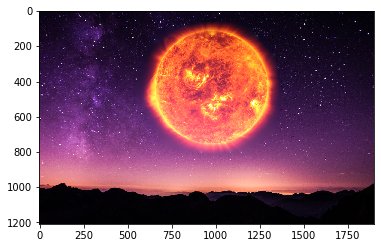

In [58]:
im_blend = poisson_blend(cropped_object, object_mask, background_img, bottom_center)
if im_blend.any():
    plt.imshow(im_blend)

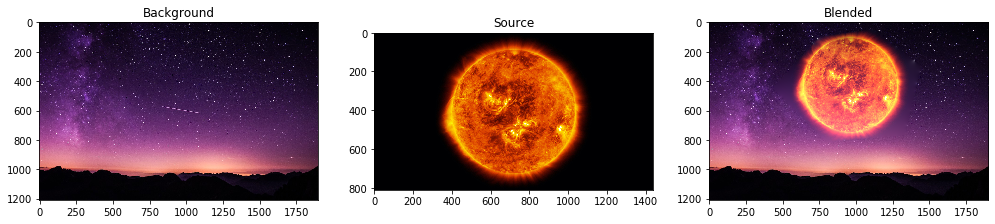

In [46]:
show_3_imgs(background_img, object_img, im_blend)

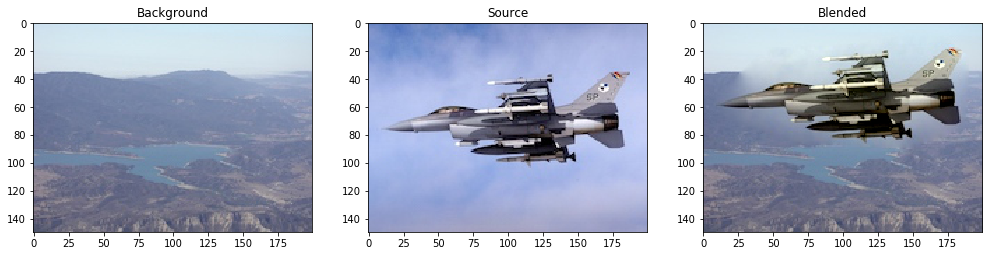

In [200]:
show_3_imgs(background_img, object_img, im_blend)

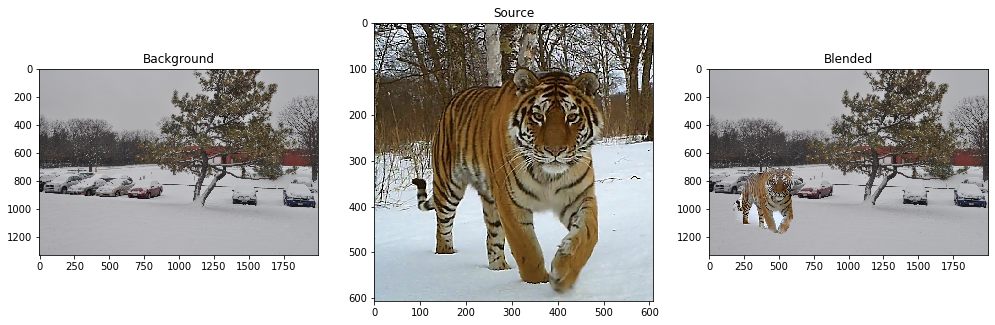

In [220]:
show_3_imgs(background_img, object_img, im_blend)

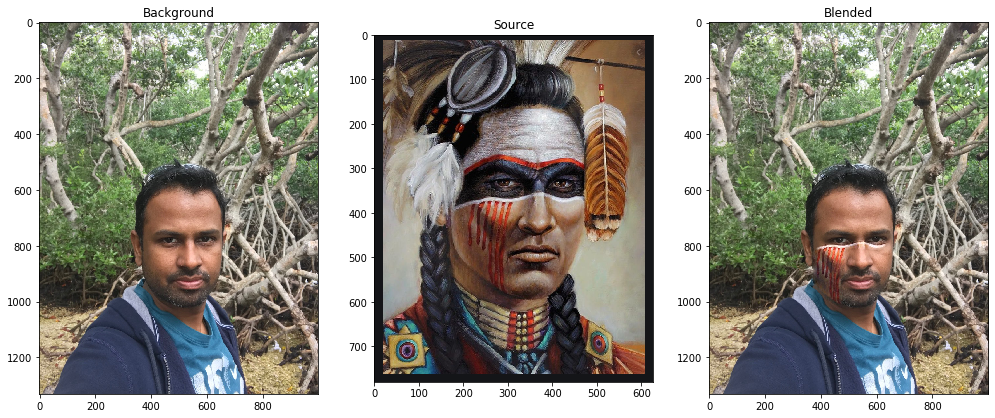

In [533]:
show_3_imgs(background_img, object_img, im_blend)

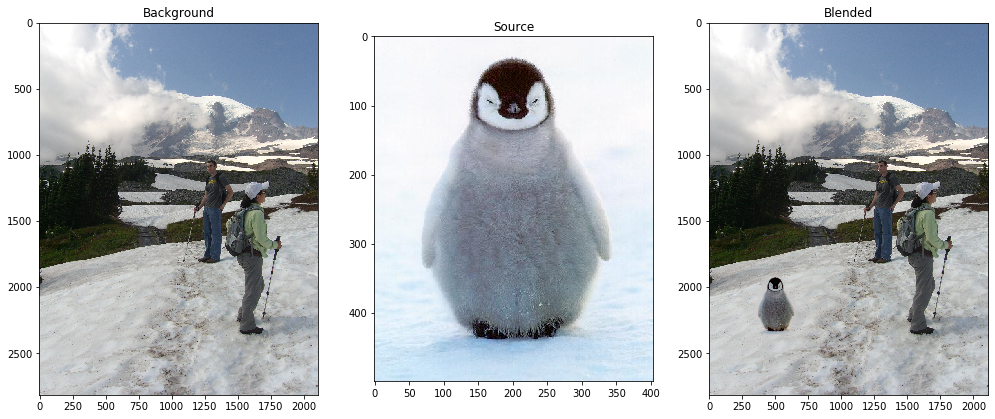

In [390]:
show_3_imgs(background_img, object_img, im_blend)

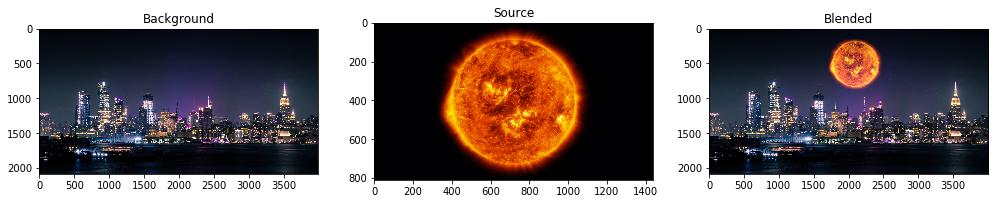

In [336]:
show_3_imgs(background_img, object_img, im_blend)

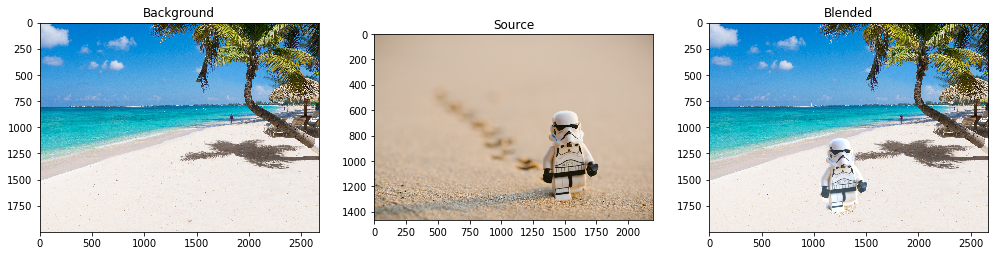

In [378]:
# Failed
show_3_imgs(background_img, object_img, im_blend)

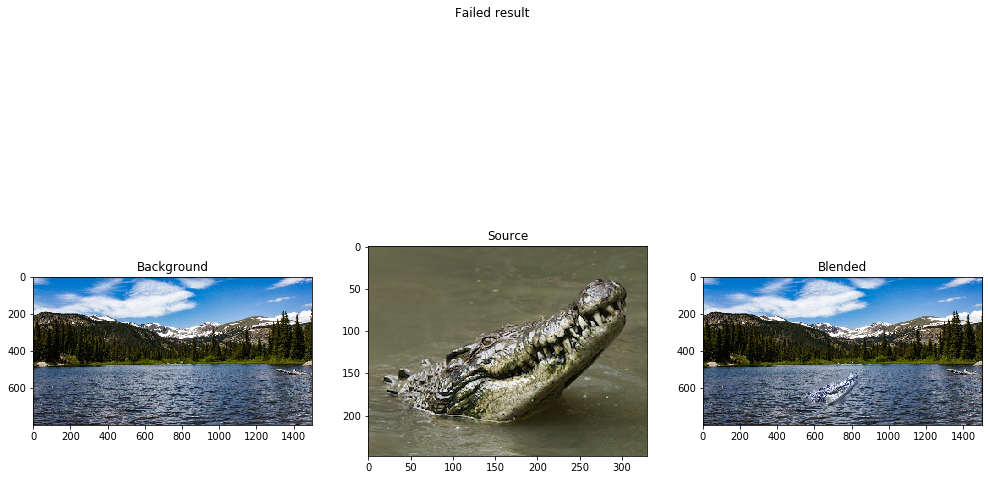

In [265]:
show_3_imgs(background_img, object_img, im_blend, failed=True)

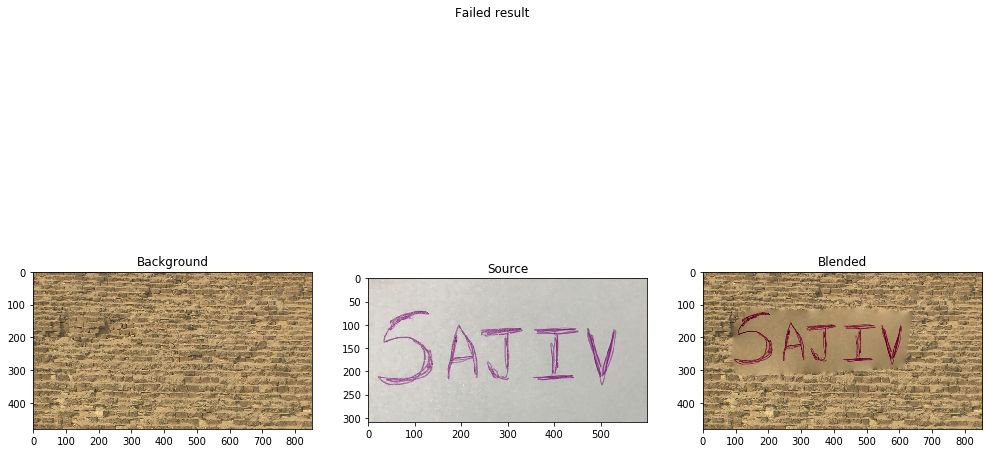

In [317]:
show_3_imgs(background_img, object_img, im_blend, failed=True)

In [59]:
cv2.imwrite("night-sun.jpg", cv2.cvtColor((im_blend*255).astype(np.uint8), cv2.COLOR_RGB2BGR))

True

## Part 3 Mixed Gradients (20 pts)

In [14]:
def mixed_gradient_sum(img_src, img_target, i, j, h, w, ofs,
                           c=1.0):
    v_sum = np.array([0.0, 0.0, 0.0])
    nb = np.array([[1, 0], [-1, 0], [0, 1], [0, -1]])
    for kk in range(4):
        fp = img_src[i, j] - img_src[i + nb[kk, 0], j + nb[kk, 1]]
        gp = img_target[i + ofs[0], j + ofs[1]] \
            - img_target[i + nb[kk, 0] + ofs[0], j + nb[kk, 1] + ofs[1]]
        v_sum += np.array([fp[0] if abs(fp[0] * c) > abs(gp[0]) else gp[0],
                           fp[1] if abs(fp[1] * c) > abs(gp[1]) else gp[1],
                           fp[2] if abs(fp[2] * c) > abs(gp[2]) else gp[2]])
    return v_sum

In [15]:
def mix_blend(cropped_object, object_mask, background_img, c=1.0):
    """
    :param cropped_object: numpy.ndarray One you get from align_source
    :param object_mask: numpy.ndarray One you get from align_source
    :param background_img: numpy.ndarray 
    """
    mask_height, mask_width = object_mask.shape
    region_size = mask_height * mask_width
    #### Helper functions ####
    getk = lambda i, j: i + j * mask_height
    grad_func = lambda ii, jj: mixed_gradient_sum(
                cropped_object, background_img, ii, jj, mask_height, mask_width, (0, 0), c) # Gradient function
    b = np.zeros((region_size, 3)) # the "b" matrix
    A = scipy.sparse.identity(region_size, format='lil') # the "A" matrix
    for i in range(mask_height):
        for j in range(mask_width):
            k = getk(i, j)
            if object_mask[i, j] == 1: # We only need to do it in the blending region
                b_s = np.array([0.0, 0.0, 0.0])
                
                if object_mask[i - 1, j] == 1:
                    A[k, k - 1] = -1
                else:
                    b_s += background_img[i - 1, j]
                
                if object_mask[i + 1, j] == 1:
                    A[k, k + 1] = -1
                else:
                     b_s += background_img[i + 1, j]
                
                if object_mask[i, j - 1] == 1:
                    A[k, k - mask_height] = -1
                else:
                     b_s += background_img[i, j - 1]
                
                if object_mask[i, j + 1] == 1:
                    A[k, k + mask_height] = -1
                else:
                    b_s += background_img[i, j + 1]
                    
                A[k, k] = 4
                b[k] = grad_func(i, j) + b_s
                
            else:
                b[k] = background_img[i, j]
    A = A.tocsr()
    output = np.empty_like(background_img)
    output[:] = background_img
    for c in range(3):
        x = spsolve(A, b[:, c]) # Solving the system of equationso
        x[x > 1] = 1
        x[x < 0] = 0
        x = x.reshape(mask_height, mask_width, order='F')
        output[:, :, c] = x
    return output

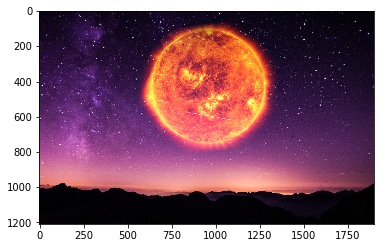

In [50]:
im_mix = mix_blend(cropped_object, object_mask, background_img, 8.0)
if im_mix.any():
    %matplotlib inline
    import matplotlib.pyplot as plt
    plt.imshow(im_mix)

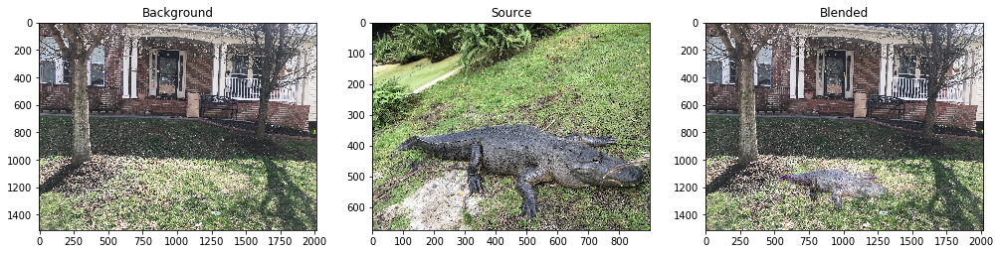

In [175]:
show_3_imgs(background_img, object_img, im_mix)

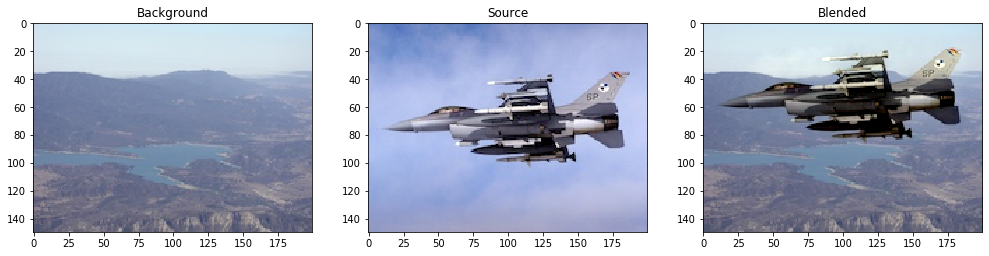

In [205]:
show_3_imgs(background_img, object_img, im_mix)

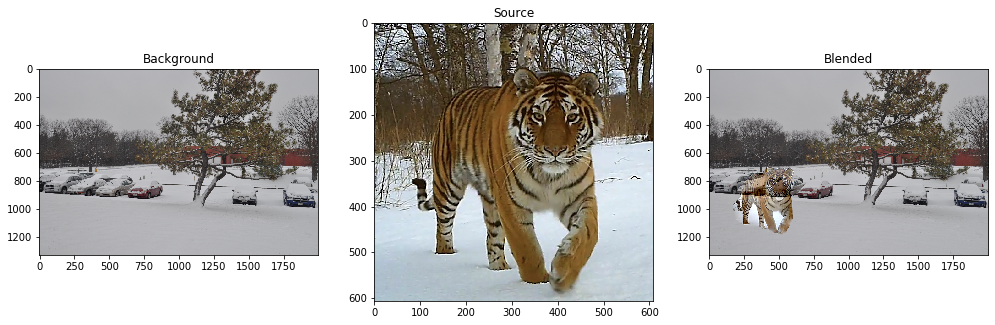

In [223]:
show_3_imgs(background_img, object_img, im_mix)

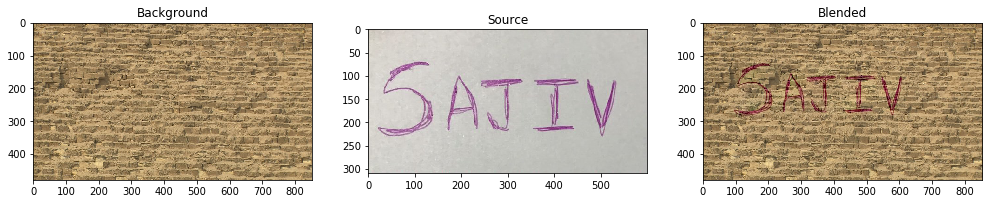

In [319]:
show_3_imgs(background_img, object_img, im_mix)

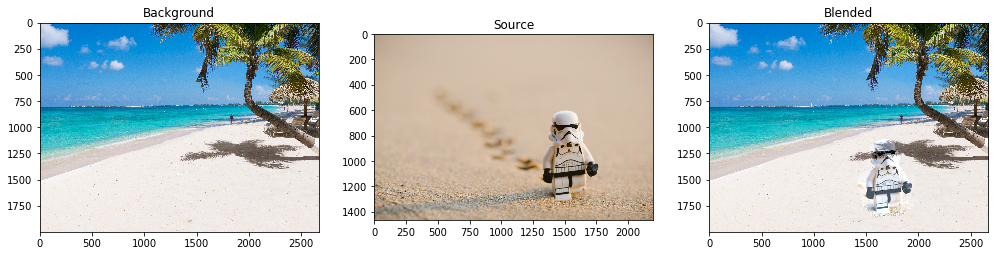

In [383]:
show_3_imgs(background_img, object_img, im_mix)

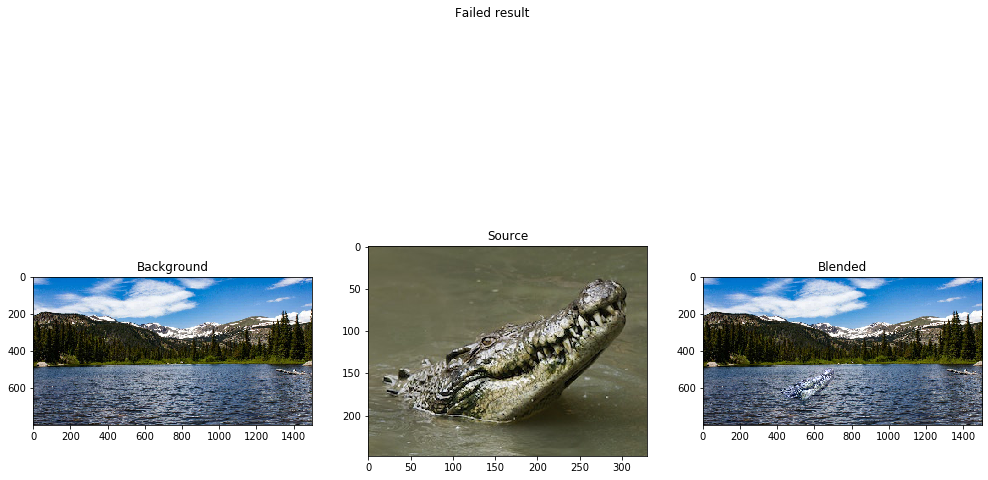

In [301]:
show_3_imgs(background_img, object_img, im_mix, failed=True)

In [51]:
cv2.imwrite("night-sun-m.jpg", cv2.cvtColor((im_mix*255).astype(np.uint8), cv2.COLOR_RGB2BGR))

True

# Bells & Whistles (Extra Points)

## Color2Gray (20 pts)

In [16]:
def show_hsv(img):
    plt.imshow(cv2.cvtColor(img.astype('uint8'), cv2.COLOR_HSV2RGB))

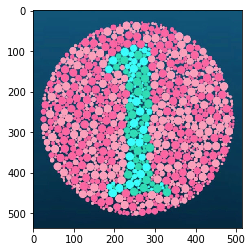

In [26]:
colorblind1 = cv2.cvtColor(cv2.imread('samples/colorblind1.jpg'), cv2.COLOR_BGR2HSV).astype('double')
plt.figure()
show_hsv(colorblind1)

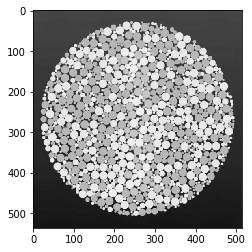

In [25]:
colorblind_gray_simple = cv2.cvtColor(cv2.imread('samples/colorblind1.jpg'), cv2.COLOR_BGR2GRAY).astype('double')
plt.imshow(colorblind_gray_simple, cmap='gray')

In [21]:
def color2gray(img):
    im_h, im_w = img.shape[0], img.shape[1]
    A = A_matrix(im_h, im_w)
    b = A.dot(img[:, :, 2].flatten())
    ans = b.reshape(im_h, im_w) + img[:, :, 1]
    return ans

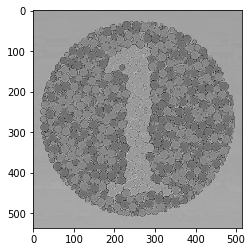

In [27]:
color_gray = color2gray(colorblind1)
# if color_gray:
plt.imshow(color_gray, cmap='gray')

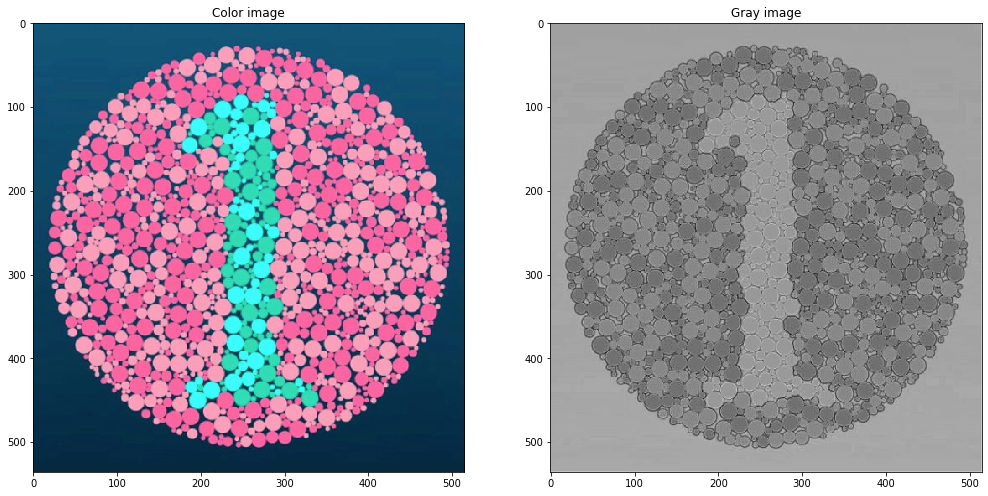

In [28]:
show_2_imgs(colorblind1, color_gray)

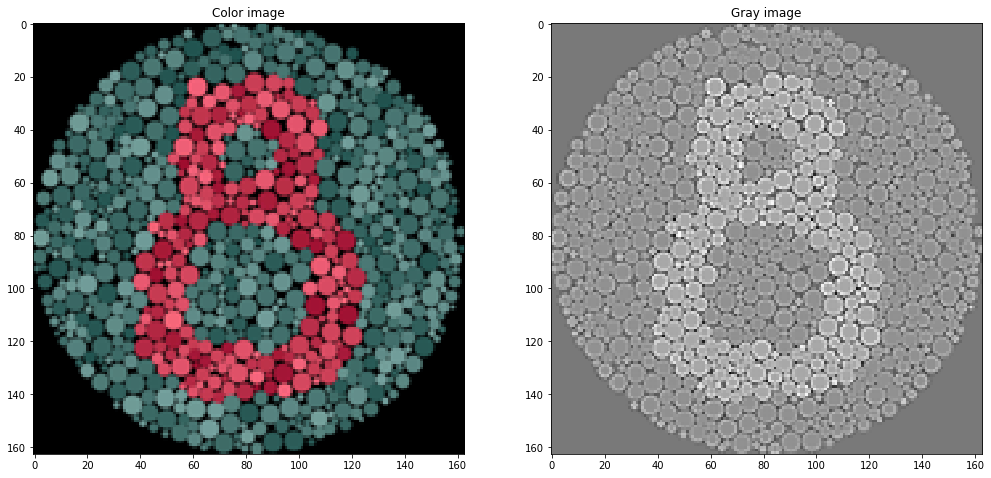

In [240]:
show_2_imgs(colorblind1, color_gray)

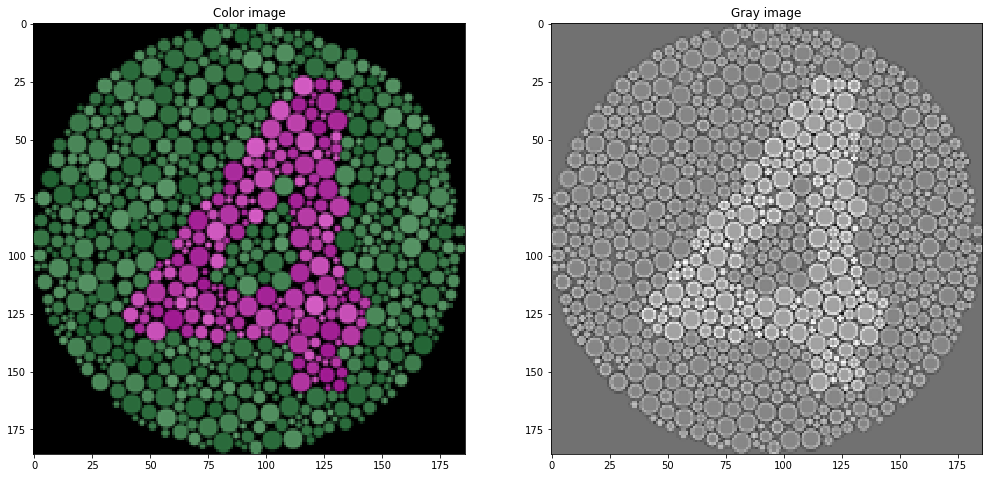

In [243]:
show_2_imgs(colorblind1, color_gray)

In [29]:
cv2.imwrite("color2gray1.jpg", color_gray)

True

## Laplacian pyramid blending (20 pts)

In [24]:
def laplacian_blend(img1, mask, img2):
    gA = img1.copy()
    gB = img2.copy()
    gM = mask.copy()
    
    gpA = [gA]
    gpB = [gB]
    gpM = [gM]
    
    for i in range(6):
        gA = cv2.pyrDown(gA)
        gB = cv2.pyrDown(gB)
        gM = cv2.pyrDown(gM)
        gpA.append(gA)
        gpB.append(gB)
        gpM.append(gM)
    lpA = [gpA[5]]
    for i in range(5,0,-1):
        size = (gpA[i-1].shape[1], gpA[i-1].shape[0])
        GE = cv2.pyrUp(gpA[i], dstsize = size)
        L = cv2.subtract(gpA[i-1],GE)
        lpA.append(L)

    lpB = [gpB[5]]
    for i in range(5,0,-1):
        size = (gpB[i-1].shape[1], gpB[i-1].shape[0])
        GE = cv2.pyrUp(gpB[i], dstsize = size)
        L = cv2.subtract(gpB[i-1],GE)
        lpB.append(L)
        
    gpM_reversed = [gpM[5]]
    for i in range(5,0,-1):
        gpM_reversed.append(gpM[i-1])
    LS = []
    lpAc=[]
    for i in range(len(lpA)):
        b=cv2.resize(lpA[i],lpB[i].shape[-2::-1])
        lpAc.append(b)
    j=0
    for i in zip(lpAc,lpB, gpM_reversed):
        la,lb,gm = i
        rows,cols,dpt = la.shape
        ls = cv2.bitwise_and(la, la, mask=gm) + cv2.bitwise_and(lb, lb, mask=(1-gm))
        j=j+1
        LS.append(ls)

    ls_ = LS[0]
    for i in range(1,6):
        size = (LS[i].shape[1], LS[i].shape[0])
        ls_ = cv2.pyrUp(ls_, dstsize = size)
        ls_ = cv2.add(ls_, LS[i])
    return ls_

In [448]:
lpl_mask = object_mask.astype(np.uint8)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


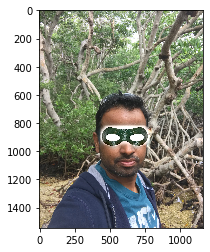

In [449]:
im_blend_l = laplacian_blend(cropped_object, lpl_mask, background_img)
if im_blend_l.any():
    plt.imshow(im_blend_l)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


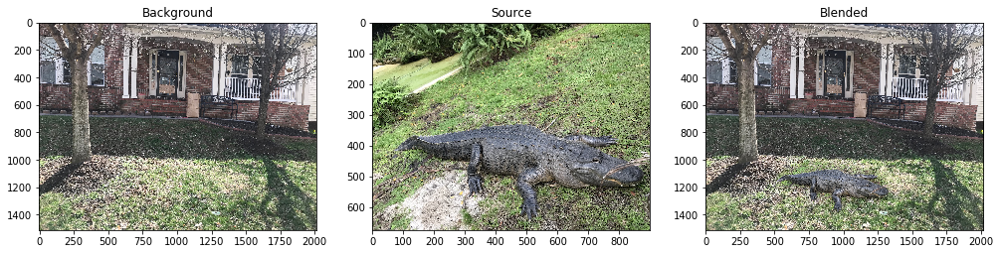

In [178]:
show_3_imgs(background_img, object_img, im_blend_l)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


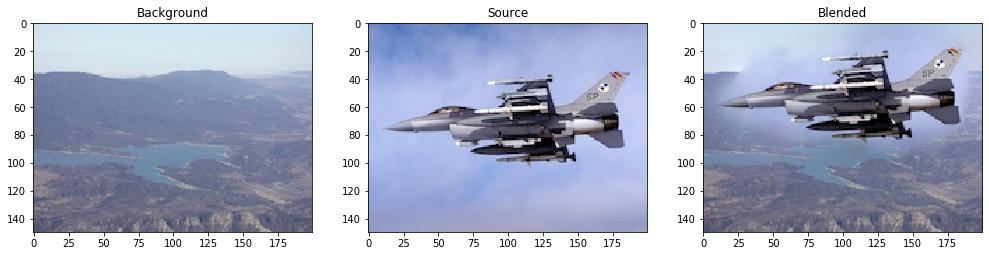

In [208]:
show_3_imgs(background_img, object_img, im_blend_l)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


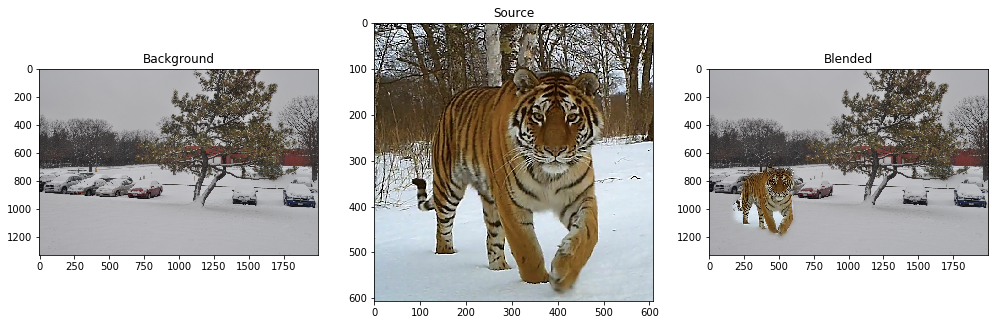

In [247]:
show_3_imgs(background_img, object_img, im_blend_l)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


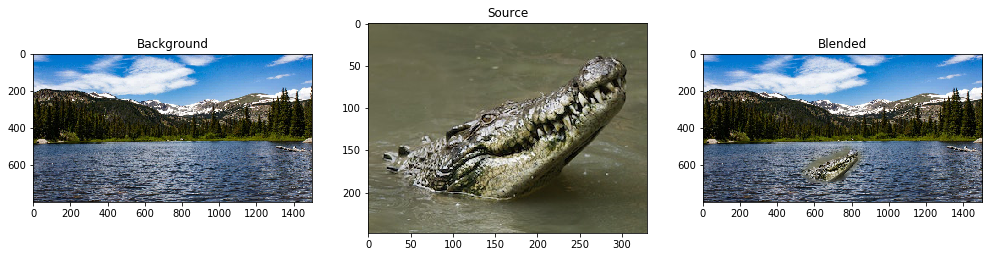

In [258]:
show_3_imgs(background_img, object_img, im_blend_l)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


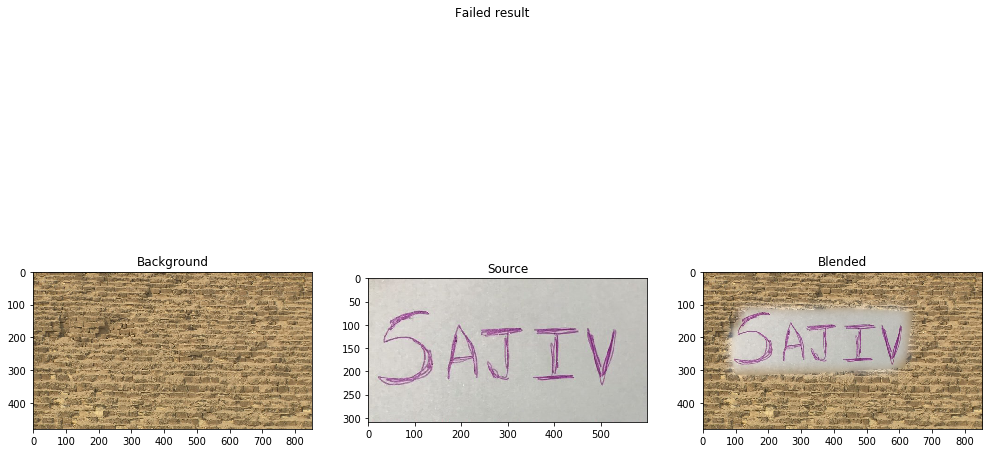

In [323]:
show_3_imgs(background_img, object_img, im_blend_l, failed=True)

In [382]:
cv2.imwrite("lego-beach-lp.png", cv2.cvtColor((im_blend_l*255).astype(np.uint8), cv2.COLOR_RGB2BGR))

True

## More gradient domain processing (up to 20 pts)